# Проект IV

## Интерактивная карта на тему "Пассажирские вокзалы Санкт-Петербурга"


In [1]:
#Импортируем библиотеки
import folium
import geopandas as gpd
import osmnx as ox
from shapely.geometry import Point, Polygon, box
import matplotlib.pyplot as plt
import requests
import pandas as pd
import polyline 
import base64
import os
import time
from folium.plugins import MarkerCluster, FeatureGroupSubGroup


Создадим наши объекты

In [2]:
# Координаты и названия вокзалов
stations = [
    {"Name": "Балтийский вокзал", "lon": 30.29867905545096, "lat": 59.90696898069087},
    {"Name": "Витебский вокзал", "lon": 30.328695684021014, "lat": 59.92016273139096},
    {"Name": "Ладожский вокзал", "lon": 30.442420161370215, "lat": 59.93426426199242},
    {"Name": "Московский вокзал", "lon": 30.362819954932526, "lat": 59.92999828727796},
    {"Name": "Финляндский вокзал", "lon": 30.357258960493215, "lat": 59.955776835251925}
]

# Создаем GeoDataFrame
points = gpd.GeoDataFrame(
    [{"Name": s["Name"], "geometry": Point(s["lon"], s["lat"])} for s in stations],
    crs="EPSG:4326"
)

# Проверяем результат
print(points)

                 Name                   geometry
0   Балтийский вокзал  POINT (30.29868 59.90697)
1    Витебский вокзал   POINT (30.3287 59.92016)
2    Ладожский вокзал  POINT (30.44242 59.93426)
3   Московский вокзал     POINT (30.36282 59.93)
4  Финляндский вокзал  POINT (30.35726 59.95578)


Переведем систему координат

In [3]:
current_crs = points.crs
print("Текущая система координат:", current_crs)

Текущая система координат: EPSG:4326


In [4]:
utm_crs = points.estimate_utm_crs()       # автоматически определяем UTM-зону
points_gdf = points.to_crs(utm_crs)       # преобразуем GeoSeries в эту проекцию
print("Новая система координат:", points_gdf.crs)

Новая система координат: EPSG:32636


Проверяем

In [5]:
points_gdf.explore(tiles='CartoDB positron')


Сделаем слой с муниципальными округами - это понадобится для построения хороплетов

In [6]:
admin_district = gpd.read_file('data/spb_admin.gpkg', layer="okrug")

In [7]:
utm_crs = admin_district.estimate_utm_crs()       # автоматически определяем UTM-зону
admin_district_utm = admin_district.to_crs(utm_crs)       # преобразуем GeoSeries в эту проекцию
print("Новая система координат:", admin_district_utm.crs)

Новая система координат: EPSG:32636


Создаем карту

In [8]:
# Введем данные вокзалов - координаты и пассажиропоток (не получилось использовать ранее введенный GeoDataFrame, запуталась)
stations_data = [
    {"name": "Балтийский вокзал", "coords": [59.90696898069087, 30.29867905545096], "passengers": 860610},
    {"name": "Витебский вокзал", "coords": [59.92016273139096, 30.328695684021014], "passengers": 734871},
    {"name": "Ладожский вокзал", "coords": [59.93426426199242, 30.442420161370215], "passengers": 433510},
    {"name": "Московский вокзал", "coords": [59.92999828727796, 30.362819954932526], "passengers": 1914625},
    {"name": "Финляндский вокзал", "coords": [59.955776835251925, 30.357258960493215], "passengers": 963810}
]

# Создаем карту
m = folium.Map(location=stations_data[0]["coords"], zoom_start=10, tiles='cartodbpositron', control_scale=True)


In [9]:
m

Построим маршруты между вокзалами и заодно отразим на карте сами вокзалы (с помощью маркеров и фотографий) и покажем пассажиропоток

In [10]:
# Слои
route_layer = folium.FeatureGroup(name='Маршруты', show=True)
marker_layer = folium.FeatureGroup(name='Вокзалы', show=True)
passenger_layer = folium.FeatureGroup(name='Пассажиропоток', show=True)
m.add_child(route_layer)
m.add_child(marker_layer)
m.add_child(passenger_layer)
marker_cluster = MarkerCluster().add_to(marker_layer)

# Цвета маршрутов
colors = ['blue', 'red', 'green', 'purple', 'orange']
color_index = 0

# Функция для расчета радиуса круга (пропорционально пассажиропотоку)
def get_radius(passengers, max_passengers):
    base_radius = 500  # Базовый радиус в метрах
    return (passengers / max_passengers) * base_radius * 2  # Умножаем на 2 для наглядности

# Находим максимальный пассажиропоток для масштабирования
max_passengers = max(station["passengers"] for station in stations_data)

# Добавляем круги пассажиропотока
for station in stations_data:
    radius = get_radius(station["passengers"], max_passengers)
    folium.Circle(
        location=station["coords"],
        radius=radius,
        color='#3186cc',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.2,
        tooltip=f"{station['name']}<br>Пассажиропоток: {station['passengers']:,}",
        popup=f"Пассажиропоток: {station['passengers']:,}"
    ).add_to(passenger_layer)

# Построение маршрутов
for i, start_station in enumerate(stations_data):
    for j, end_station in enumerate(stations_data):
        if i == j:
            continue
            
        start_coords = f"{start_station['coords'][1]},{start_station['coords'][0]}"
        end_coords = f"{end_station['coords'][1]},{end_station['coords'][0]}"
        url = f"http://router.project-osrm.org/route/v1/driving/{start_coords};{end_coords}?overview=full"
        
        try:
            time.sleep(0.5)
            response = requests.get(url)
            data = response.json()
            
            if response.status_code == 200 and data['code'] == 'Ok':
                route = data["routes"][0]
                distance = route["distance"]
                
                folium.PolyLine(
                    polyline.decode(route["geometry"]),
                    color=colors[color_index % len(colors)],
                    weight=3,
                    opacity=0.7,
                    tooltip=f"{start_station['name']} → {end_station['name']}<br>Расстояние: {round(distance/1000, 1)} км"
                ).add_to(route_layer)
                
                color_index += 1
        except Exception as e:
            print(f"Ошибка маршрута {i}→{j}: {str(e)}")

# Добавляем маркеры с фото
for station in stations_data:
    photo_path = os.path.join("photos", f"{station['name']}.jpeg")
    if os.path.exists(photo_path):
        with open(photo_path, "rb") as f:
            img_base64 = base64.b64encode(f.read()).decode("utf-8")
        html = f'<h4>{station["name"]}</h4><p>Пассажиропоток: {station["passengers"]:,}</p><img src="data:image/jpeg;base64,{img_base64}" width="200">'
    else:
        html = f'<h4>{station["name"]}</h4><p>Пассажиропоток: {station["passengers"]:,}</p><p><i>Фото не найдено</i></p>'
    
    folium.Marker(
        location=station["coords"],
        popup=folium.Popup(html, max_width=250),
        tooltip=station["name"],
        icon=folium.Icon(icon='train', prefix='fa', color='darkblue')
    ).add_to(marker_cluster)


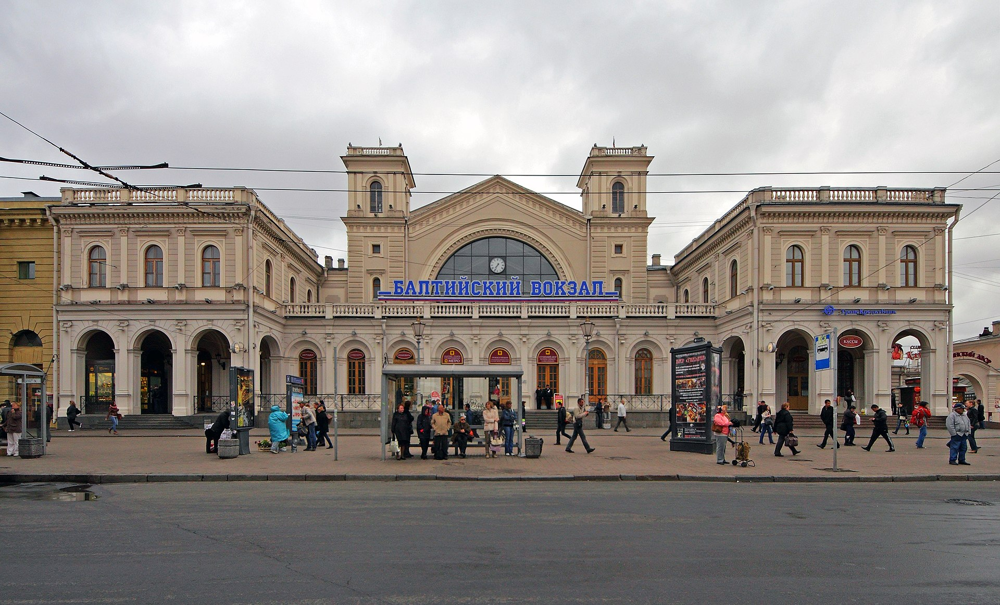
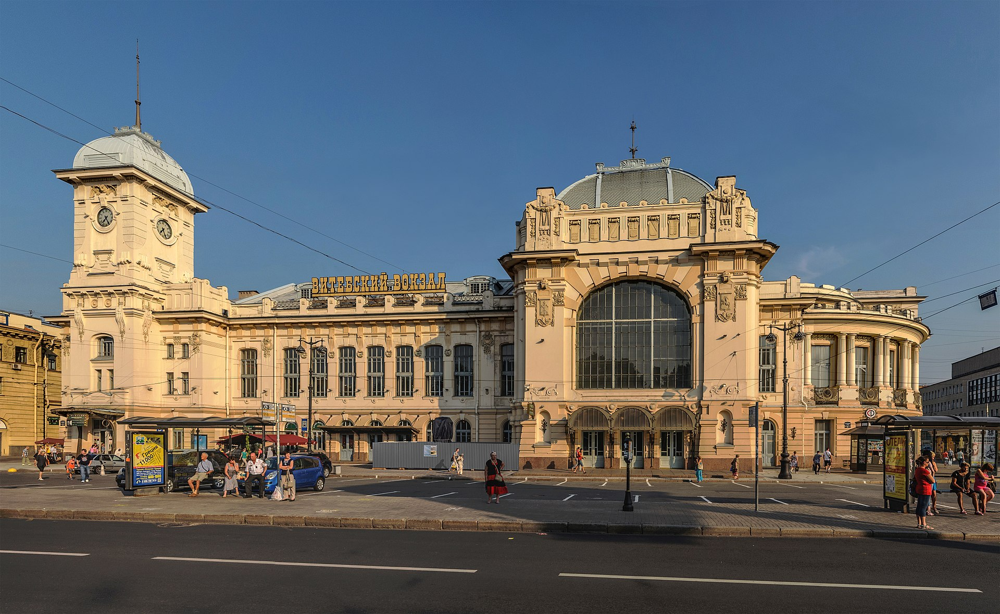
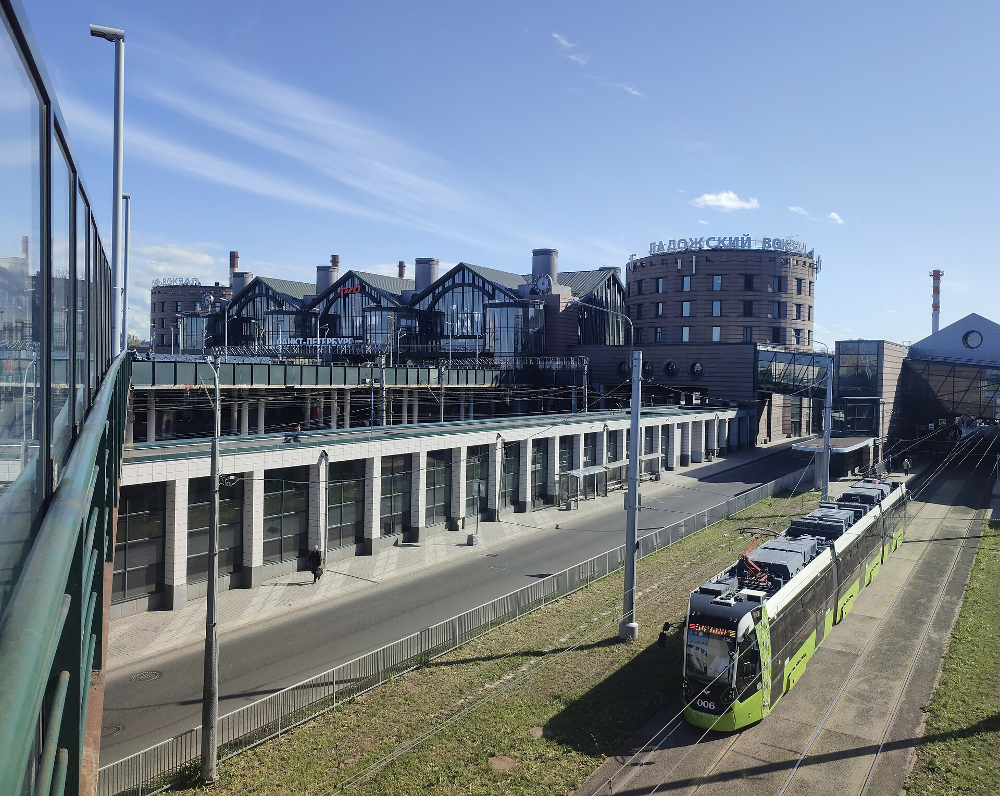
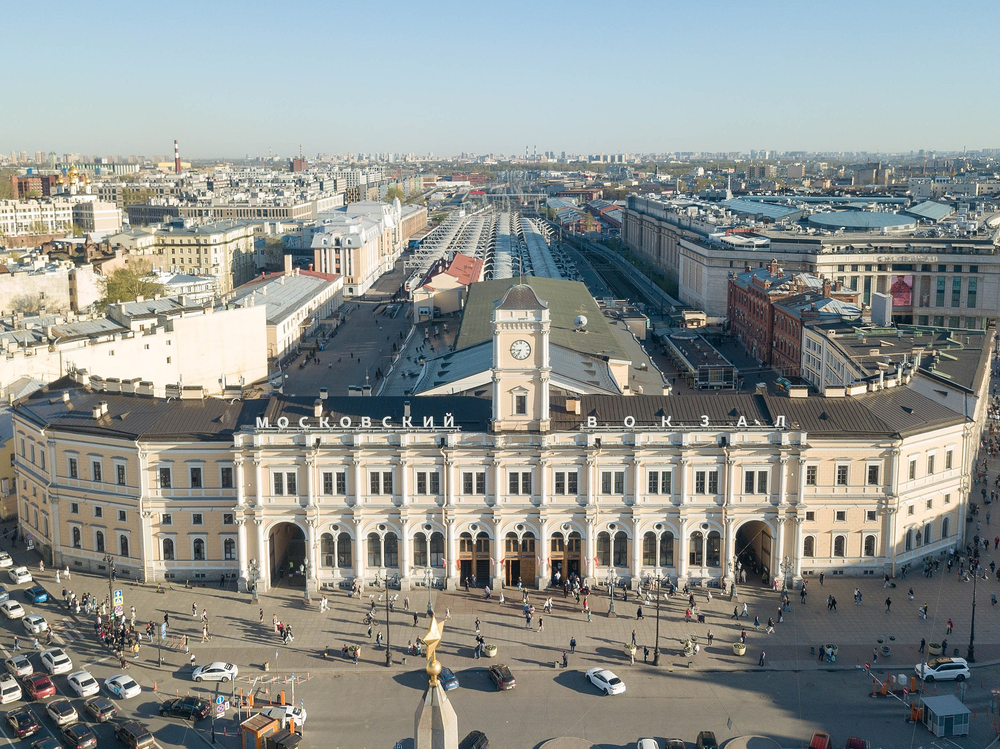
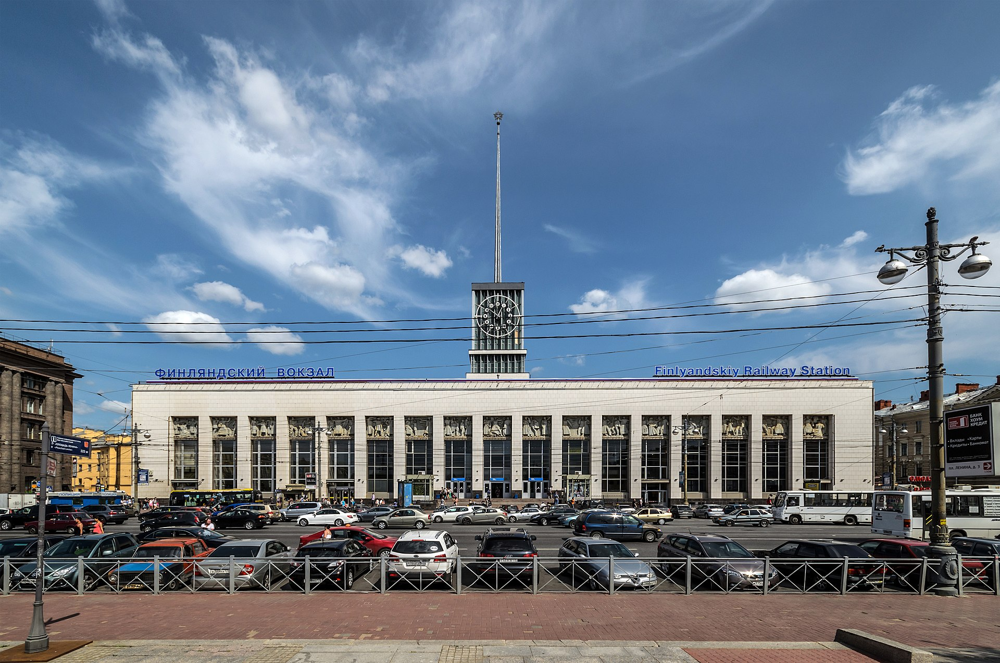

In [11]:
m

Теперь посчитаем плотность распределения вокзалов в городе - построим картограмму

In [12]:
points_gdf_with_admin_district_utm = gpd.sjoin(points_gdf, admin_district_utm, predicate='within')
points_gdf_with_admin_district_utm[['Name', 'geometry', 'NAME']].head()

,Name,geometry,NAME
0,Балтийский вокзал,POINT (348931.575 6644132.672),округ Измайловское
1,Витебский вокзал,POINT (350668.9 6645533.095),округ Семёновский
2,Ладожский вокзал,POINT (357084.846 6646851.639),округ Малая Охта
3,Московский вокзал,POINT (352619.475 6646551.371),округ Лиговка-Ямская
4,Финляндский вокзал,POINT (352423.436 6649433.12),Финляндский округ


In [13]:
# Группировка и подсчет 
if not points_gdf_with_admin_district_utm.empty:
    points_gdf_count = points_gdf_with_admin_district_utm.groupby('NAME').size().reset_index(name='points_gdf_count')
else:
    points_gdf_count = gpd.GeoDataFrame(columns=['v', 'points_gdf_count'])

# Соединение с МО
admin_district_utm_with_count = admin_district_utm.merge(
    points_gdf_count,
    on='NAME',
    how='left'
).fillna({'points_gdf_count': 0})

# Расчет показателя 
admin_district_utm_with_count['points_gdfPerPop'] = (
    admin_district_utm_with_count['points_gdf_count'] / 
    (admin_district_utm_with_count['Popul'].replace(0, 1) / 100000)
)

# Результат
admin_district_utm_with_count.head()

,NAME,Popul,geometry,points_gdf_count,points_gdfPerPop
0,округ Пискарёвка,61706.0,"MULTIPOLYGON (((352703.954 6653672.464, 353647...",0.0,0.0
1,Смолячково,742.0,"MULTIPOLYGON (((302068.083 6677873.169, 303389...",0.0,0.0
2,Молодёжное,1685.0,"MULTIPOLYGON (((303389.678 6679568.341, 303601...",0.0,0.0
3,Серово,272.0,"MULTIPOLYGON (((305157.564 6681218.991, 305563...",0.0,0.0
4,Кронштадт,44374.0,"MULTIPOLYGON (((312486.108 6659698.584, 312488...",0.0,0.0


In [14]:
folium.Choropleth(
    name='Картограмма плотности расположения вокзалов',
    geo_data=admin_district_utm_with_count,
    data=admin_district_utm_with_count,
    columns=['NAME', 'points_gdfPerPop'],
    fill_color='YlGnBu',
    fill_opacity = 0.5,
    key_on='feature.properties.NAME',
    nan_fill_color='lightgray',
    nan_fill_opacity=0.4,
   line_color = "white",
   legend_name="Вокзалов на 100 000 жителей"
).add_to(m)


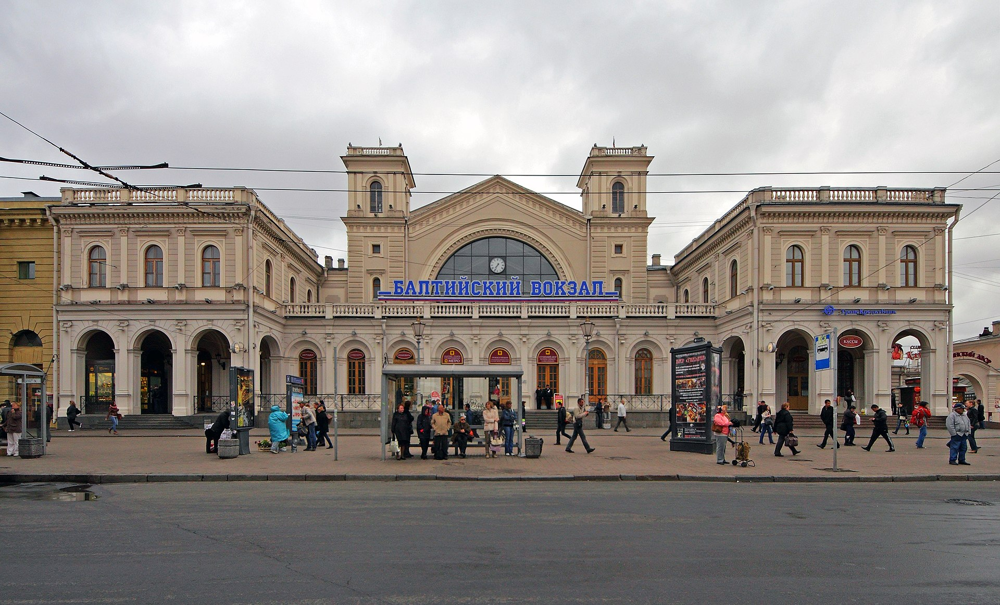
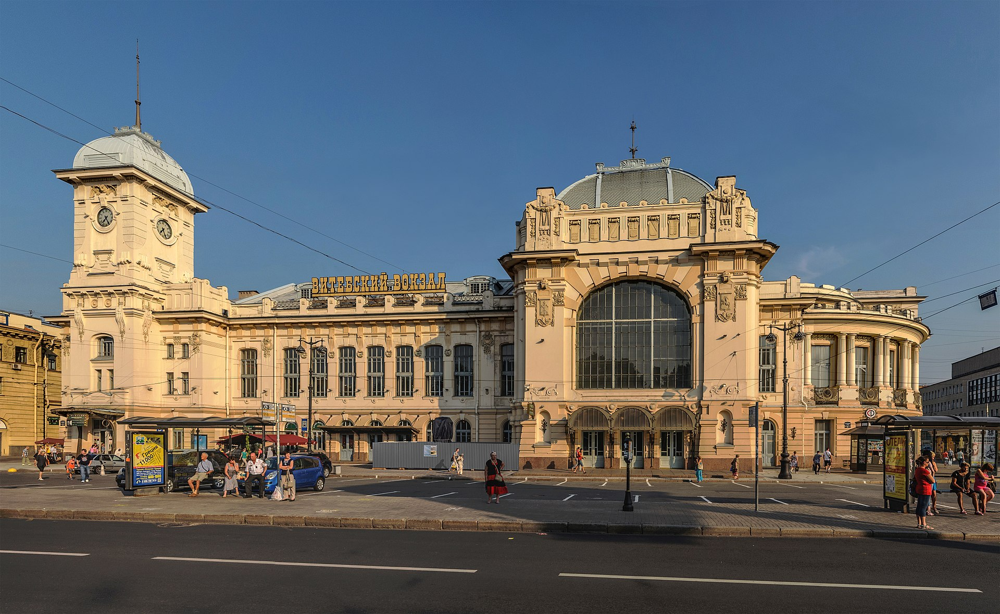
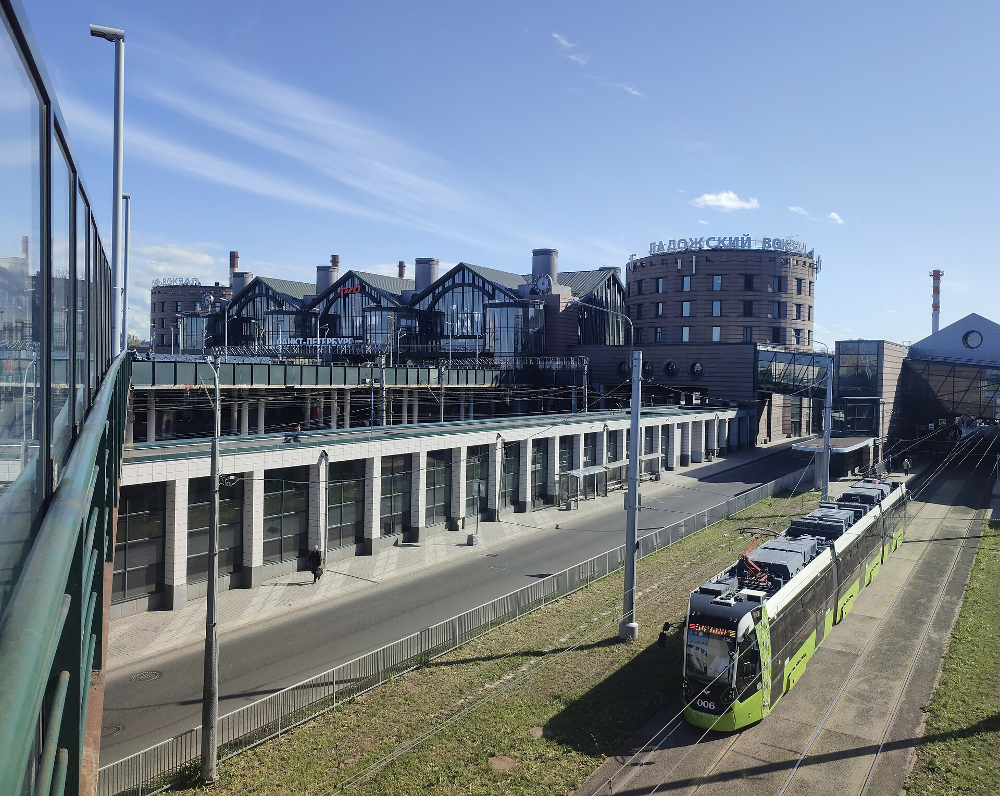
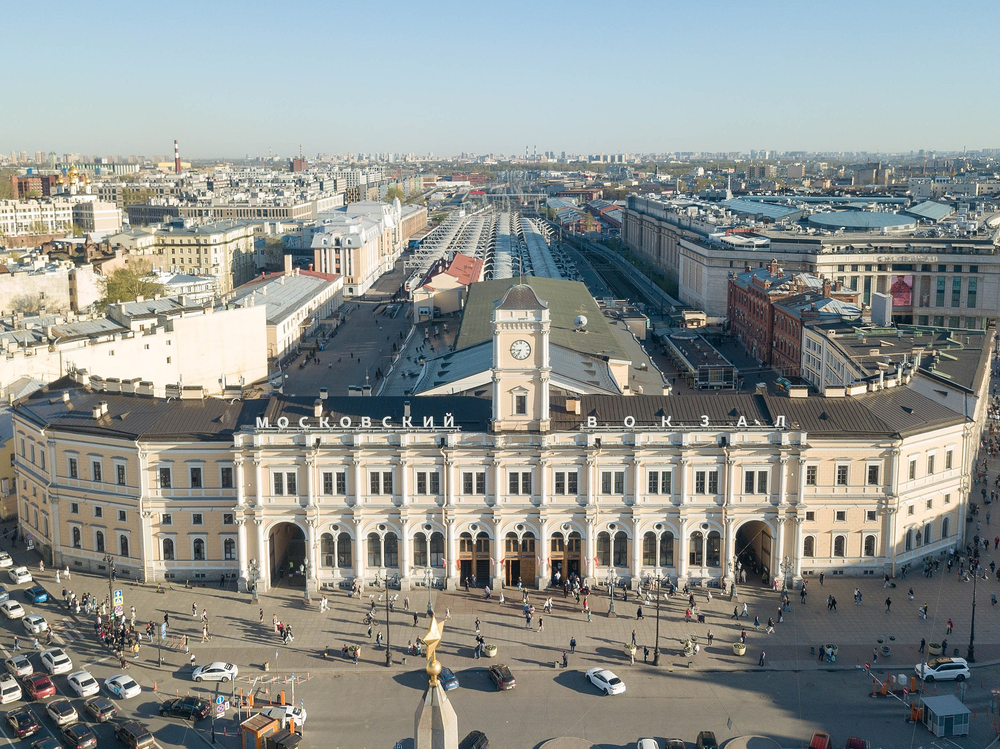
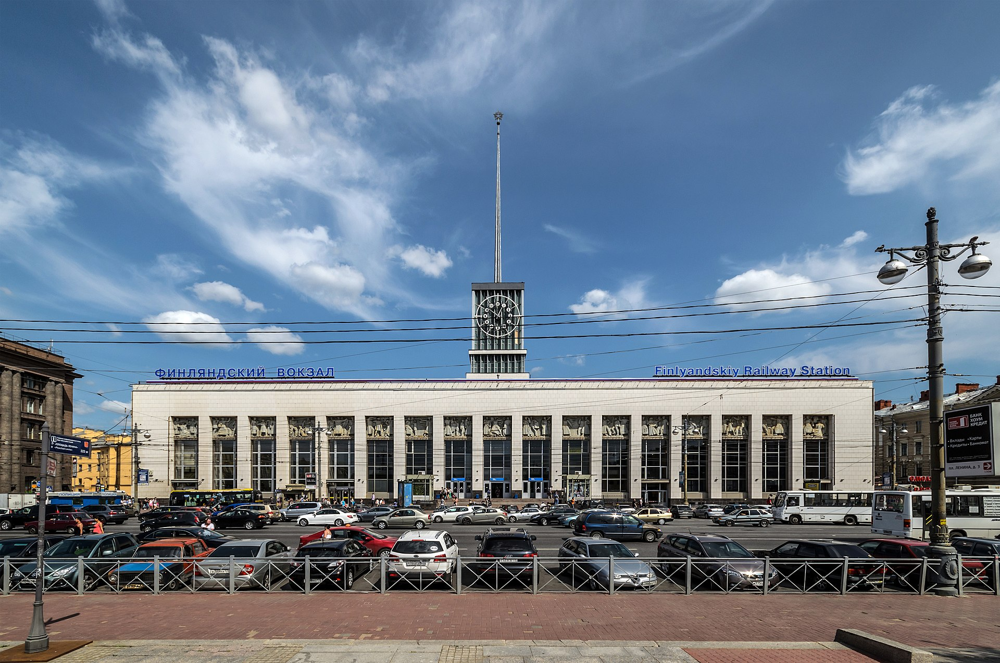

In [15]:
m

Добавляем подсказку, контроль слоёв, координаты курсора, полноэкранный режим

In [16]:
folium.GeoJson(
    admin_district_utm_with_count,
    name="Карта города",
    style_function=lambda x: {
        'fillColor': 'transparent',
        'color': 'transparent',
        'weight': 0
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'points_gdf_count'],
        aliases=['Округ:', 'Количество вокзалов:'],
        localize=True
    )
).add_to(m)

In [17]:
from folium.plugins import MousePosition
from folium.plugins import Fullscreen

In [18]:
folium.LayerControl().add_to(m)

In [19]:
MousePosition().add_to(m)


In [20]:
Fullscreen(
    position="bottomright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)

Радуемся результату!


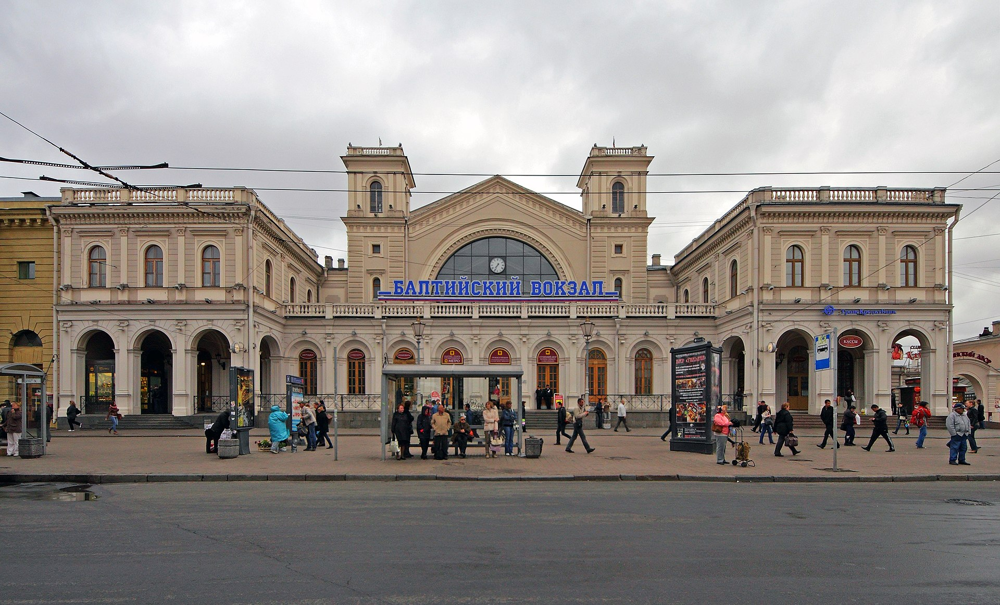
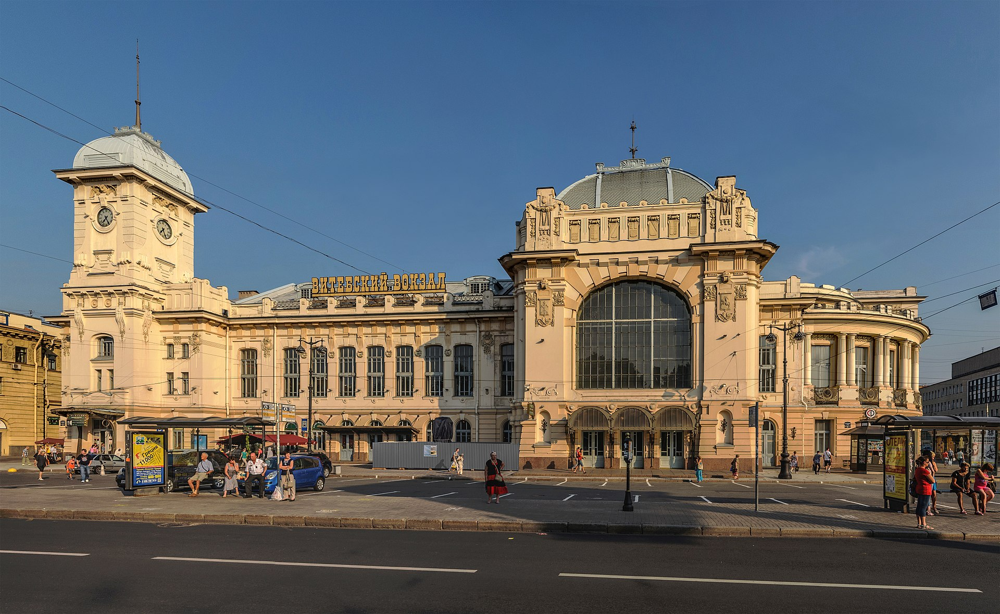
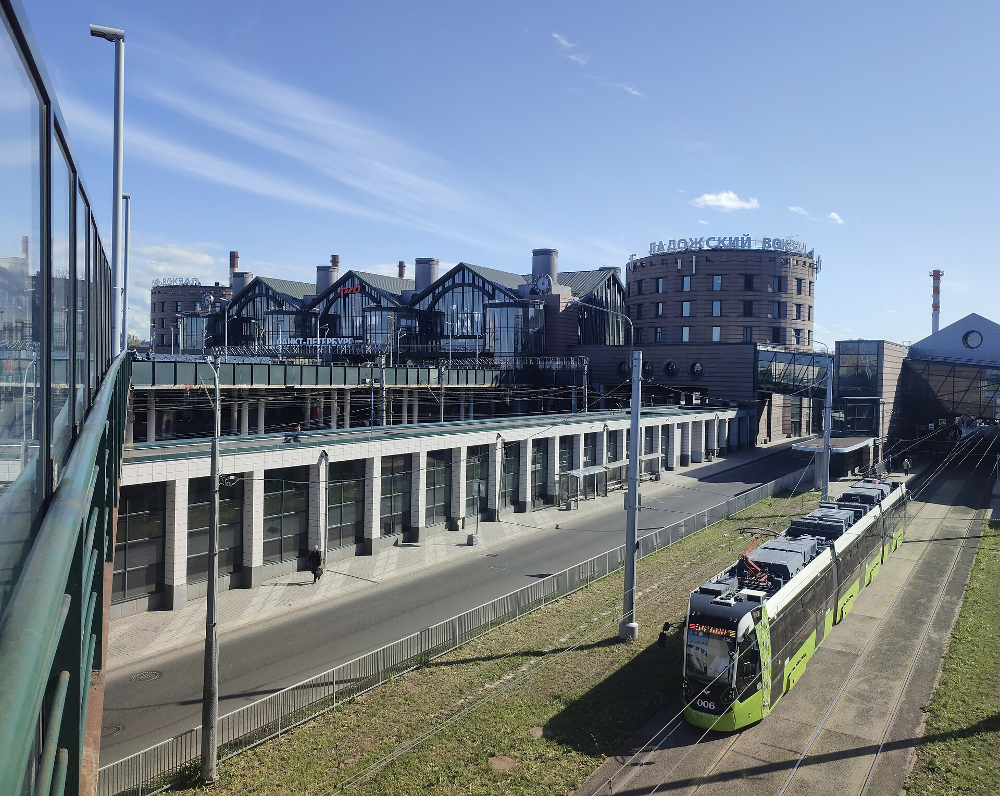
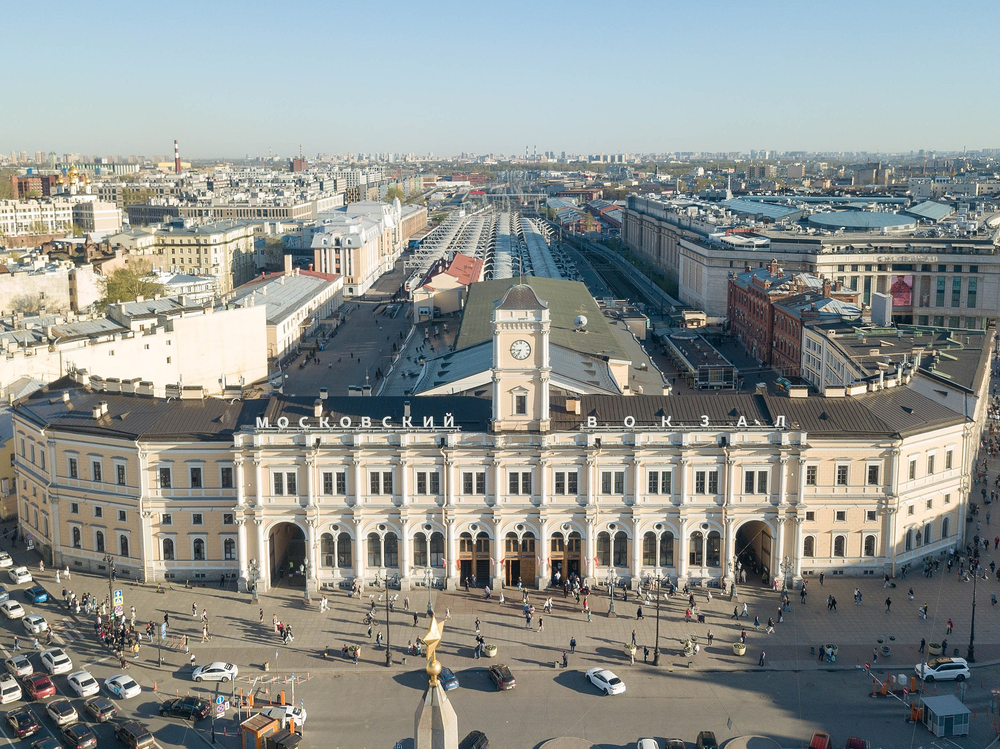
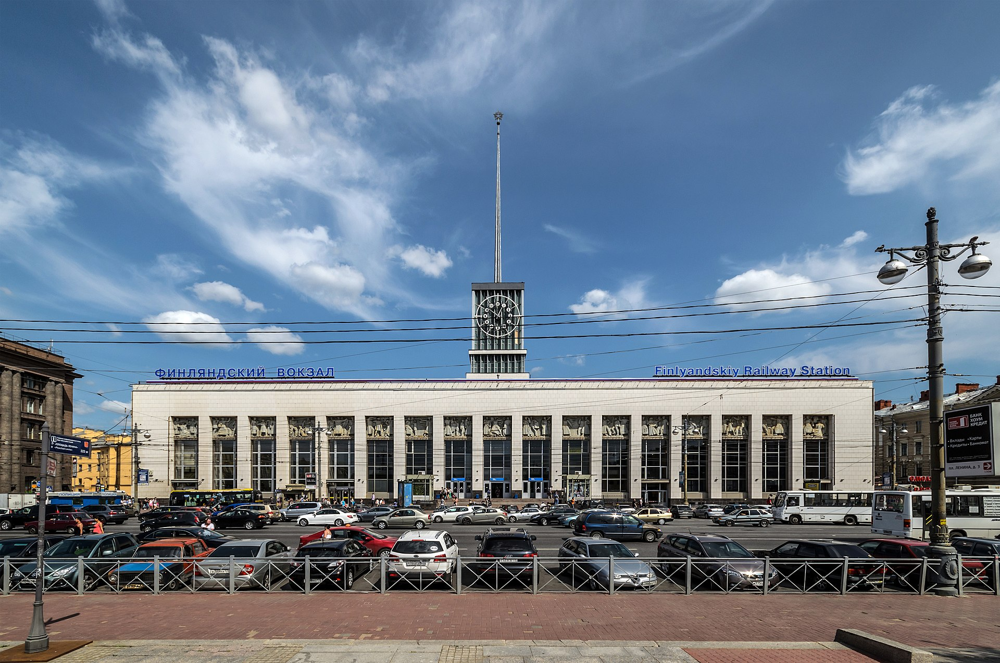

In [21]:
m

In [22]:
m.save("index.html")